# Visualize Data with and without anomalies

To do:
* Need data without anomalies to train with.

### IMU Data

In [1]:
import glob
import pandas as pd

# Path to the folder containing the CSV files
folder_path = "TFO Data\IMU"

# Get the list of CSV files in the folder
file_list = glob.glob(folder_path + "\*.csv")

# Iterate over each file
for file_path in file_list:
    # Read the CSV file into a pandas dataframe
    df = pd.read_csv(file_path)
    
    # Show the head of the dataframe
    title = file_path.split("\\")[-1]
    print(f"Head of {title}:")
    print(df.head())
    print()

Head of P19V1_20.csv:
  time  index    ax1    ay1    az1    gx1    gy1    gz1    ax2    ay2    az2  \
0  NaN     85  0.042 -0.434 -0.837 -1.717  1.022  0.816  0.133  0.005 -1.031   
1  NaN    176  0.043 -0.437 -0.842 -1.846  0.916  0.496  0.135  0.005 -1.027   
2  NaN    267  0.044 -0.434 -0.839 -1.717  1.289  0.687  0.133  0.004 -1.028   
3  NaN    358  0.040 -0.438 -0.836 -1.724  1.106  0.732  0.135  0.005 -1.026   
4  NaN    449  0.044 -0.438 -0.838 -1.671  1.022  0.534  0.135  0.003 -1.023   

     gx2    gy2    gz2  temperature  
0 -3.113  1.747 -1.862          0.0  
1 -2.853  1.717 -1.869          0.0  
2 -2.350  1.785 -1.801          0.0  
3 -2.396  1.831 -1.640          0.0  
4 -2.335  1.923 -1.404          0.0  

Head of P19V1_F5.csv:
  time  index    ax1    ay1    az1    gx1    gy1    gz1    ax2    ay2    az2  \
0  NaN     85 -0.102 -0.447 -0.816 -2.319  2.182  0.282  0.129 -0.147 -1.006   
1  NaN    176 -0.103 -0.444 -0.816 -2.739  1.976 -0.031  0.127 -0.146 -1.005   
2  NaN

Plot of P19V1_20.csv


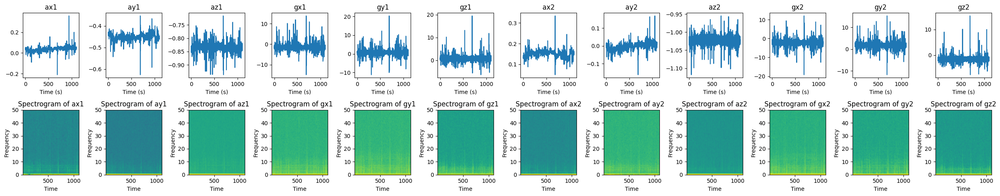

Plot of P19V1_F5.csv


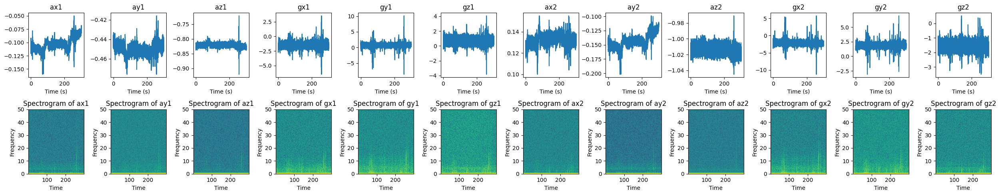

Plot of P19V1_L5.csv


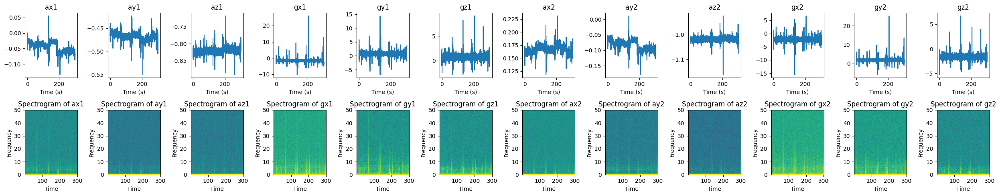

Plot of P19V2_20.csv


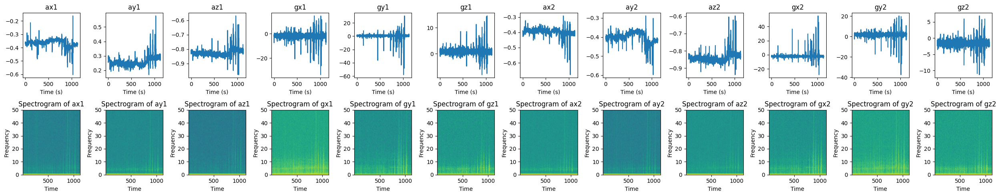

Plot of P19V2_F5.csv


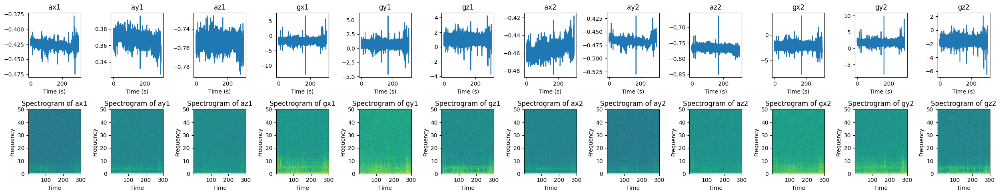

Plot of P19V2_L5.csv


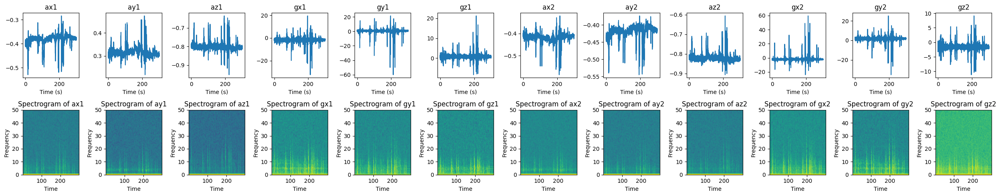

Plot of P20V1_20.csv


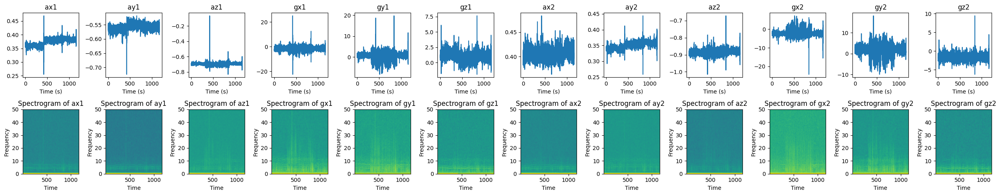

Plot of P20V1_F5.csv


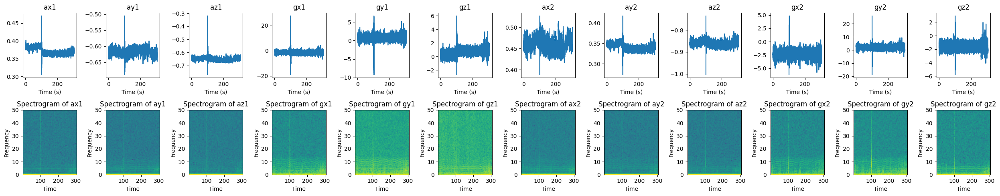

Plot of P20V1_L5.csv


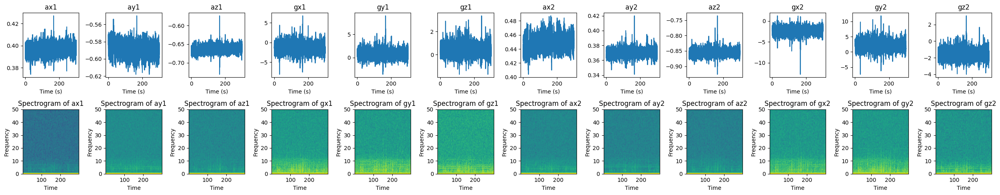

Plot of P20V2_20_1.csv


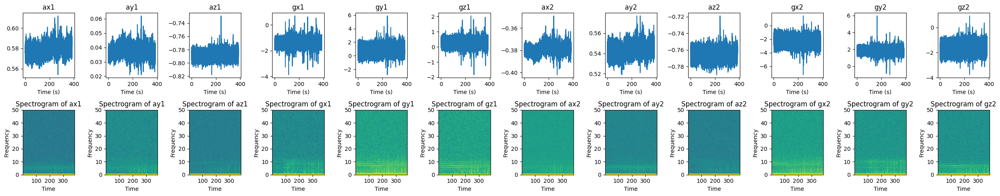

Plot of P20V2_20_2.csv


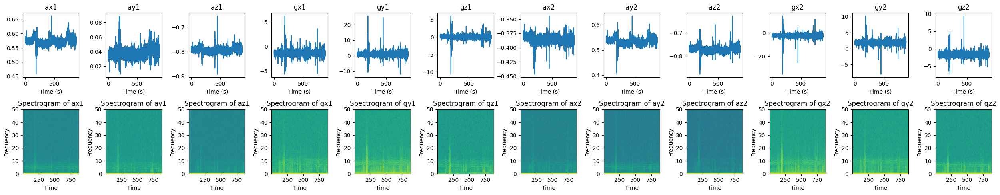

Plot of P20V2_F5.csv


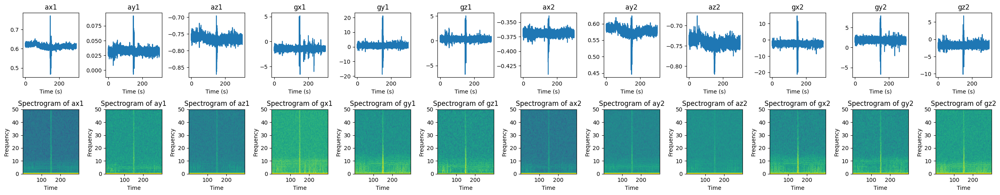

Plot of P20V2_L5.csv


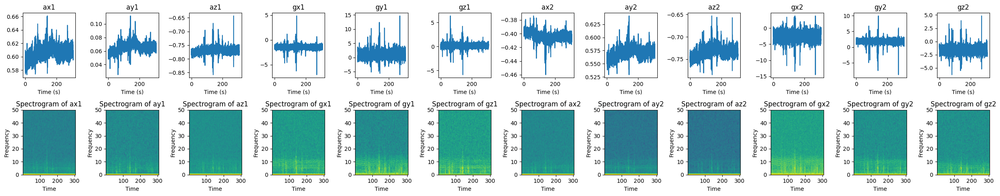

Plot of P20V3_20_1.csv


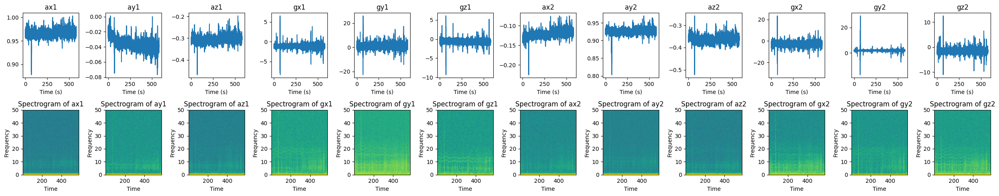

Plot of P20V3_20_2.csv


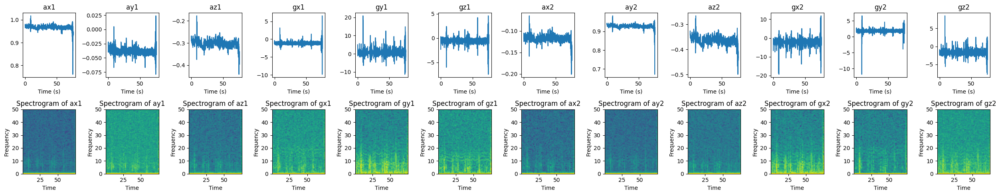

Plot of P20V3_F5.csv


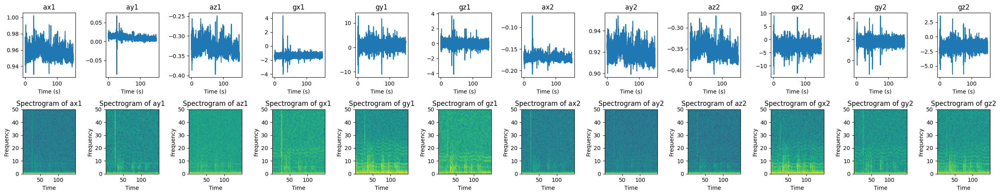

Plot of P20V3_L5.csv


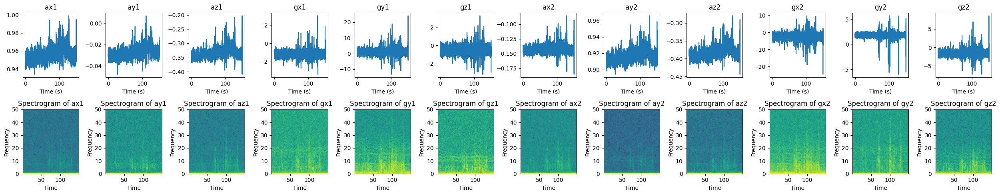

In [4]:
import matplotlib.pyplot as plt
import numpy as np

Fs = 100 #Hz
columns = df.columns[2:-1]

# Iterate over each file
for file_path in file_list:
    # Read the CSV file into a pandas dataframe
    df = pd.read_csv(file_path)
    title = file_path.split("\\")[-1]
    print(f"Plot of {title}")

    fig, axes = plt.subplots(nrows=2, ncols=len(columns), figsize=(25, 5))
    axes = axes.flatten()

    for i, column in enumerate(columns):
        t = np.arange(0, len(df[column])/Fs, 1/Fs)
        axes[i].plot(t, df[column])
        axes[i].set_title(column)
        axes[i].set_xlabel('Time (s)')

        # axes[i+len(columns)].magnitude_spectrum(df[column], Fs=Fs, scale='dB', color='C1')
        axes[i+len(columns)].specgram(df[column], Fs=Fs)
        axes[i+len(columns)].set_xlabel('Time')
        axes[i+len(columns)].set_ylabel('Frequency')
        axes[i+len(columns)].set_title(f'Spectrogram of {column}')
    

    plt.tight_layout()
    plt.show()